In [1]:
import pandas as pd
import matplotlib.pyplot as plt
from IPython.core.pylabtools import figsize
from PIL.ImageOps import scale
from sympy import rotations

In [2]:
# 读入代码
dataset = pd.read_csv('5-Site_DG-PV1-DB-DG-M1A.csv')
dataset

,timestamp,Current_Phase_Average_Mean,Active_Energy_Delivered_Received,Active_Power,Wind_Speed,Weather_Temperature_Celsius,Global_Horizontal_Radiation,Wind_Direction,Weather_Daily_Rainfall,Max_Wind_Speed,Air_Pressure,Hail_Accumulation,Pyranometer_1,Temperature_Probe_1,Temperature_Probe_2
0,2016-04-01 23:45:00,4.837368,1.521667e+05,-0.174916,1.386667,21.733334,-3.157586,228.800003,0.0,2.0,957.099976,0.0,99999.898438,37.152992,37.188801
1,2016-04-01 23:50:00,4.837759,1.521667e+05,-0.175183,1.096667,21.523333,-3.060027,249.133331,0.0,2.0,957.099976,0.0,99999.898438,92.096169,37.268780
2,2016-04-01 23:55:00,4.837431,1.521666e+05,-0.175142,0.420000,21.606667,-3.305817,151.133331,0.0,1.4,957.099976,0.0,99999.898438,55.639309,37.327877
3,2016-04-02 00:00:00,4.836120,1.521666e+05,-0.175061,0.506667,21.753334,-3.252611,233.600006,0.0,1.3,957.079956,0.0,99999.898438,37.357906,37.340668
4,2016-04-02 00:05:00,4.839127,1.521666e+05,-0.174990,0.240000,21.673334,-3.593779,283.233337,0.0,0.6,957.000000,0.0,99999.898438,37.292046,37.281826
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
892089,2024-11-28 19:05:00,41.102299,9.434821e+06,18.486418,1.723333,29.906666,42.478260,138.266663,0.0,2.6,952.363342,0.0,27.218464,42.999866,42.848019
892090,2024-11-28 19:10:00,34.450981,9.434822e+06,11.461096,1.900000,29.836666,24.904957,153.100006,0.0,2.2,952.429993,0.0,17.444036,42.833889,42.669643
892091,2024-11-28 19:15:00,30.196405,9.434822e+06,4.787055,2.570000,29.799999,12.571204,163.133331,0.0,4.0,952.500000,0.0,8.638150,42.665501,42.486244
892092,2024-11-28 19:20:00,27.765467,9.434822e+06,2.028671,2.256667,29.716667,4.768786,140.666672,0.0,3.7,952.599976,0.0,3.465366,42.532448,42.332005


In [3]:
# 其中太阳辐射强度，温度，湿度，风速会影响光伏输出功率
# 有功功率为负数，说明是发电
# 倒序
dataset.sort_index(inplace=True)
# 预测半小时之后
pre_mins = 6
# 设置标签，标签即为目标，如预测的结果
dataset['label'] = dataset['Active_Power'].shift(-pre_mins)
# 选择列显示
dataset.loc[:, ['timestamp', 'Active_Power', 'label']]

,timestamp,Active_Power,label
0,2016-04-01 23:45:00,-0.174916,-0.174677
1,2016-04-01 23:50:00,-0.175183,-0.174446
2,2016-04-01 23:55:00,-0.175142,-0.174936
3,2016-04-02 00:00:00,-0.175061,-0.174776
4,2016-04-02 00:05:00,-0.174990,-0.174752
...,...,...,...
892089,2024-11-28 19:05:00,18.486418,NaN
892090,2024-11-28 19:10:00,11.461096,NaN
892091,2024-11-28 19:15:00,4.787055,NaN
892092,2024-11-28 19:20:00,2.028671,NaN


In [4]:
# 数据预处理-1
# 为NaN的值填为0
dataset.fillna(0)

,timestamp,Current_Phase_Average_Mean,Active_Energy_Delivered_Received,Active_Power,Wind_Speed,Weather_Temperature_Celsius,Global_Horizontal_Radiation,Wind_Direction,Weather_Daily_Rainfall,Max_Wind_Speed,Air_Pressure,Hail_Accumulation,Pyranometer_1,Temperature_Probe_1,Temperature_Probe_2,label
0,2016-04-01 23:45:00,4.837368,1.521667e+05,-0.174916,1.386667,21.733334,-3.157586,228.800003,0.0,2.0,957.099976,0.0,99999.898438,37.152992,37.188801,-0.174677
1,2016-04-01 23:50:00,4.837759,1.521667e+05,-0.175183,1.096667,21.523333,-3.060027,249.133331,0.0,2.0,957.099976,0.0,99999.898438,92.096169,37.268780,-0.174446
2,2016-04-01 23:55:00,4.837431,1.521666e+05,-0.175142,0.420000,21.606667,-3.305817,151.133331,0.0,1.4,957.099976,0.0,99999.898438,55.639309,37.327877,-0.174936
3,2016-04-02 00:00:00,4.836120,1.521666e+05,-0.175061,0.506667,21.753334,-3.252611,233.600006,0.0,1.3,957.079956,0.0,99999.898438,37.357906,37.340668,-0.174776
4,2016-04-02 00:05:00,4.839127,1.521666e+05,-0.174990,0.240000,21.673334,-3.593779,283.233337,0.0,0.6,957.000000,0.0,99999.898438,37.292046,37.281826,-0.174752
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
892089,2024-11-28 19:05:00,41.102299,9.434821e+06,18.486418,1.723333,29.906666,42.478260,138.266663,0.0,2.6,952.363342,0.0,27.218464,42.999866,42.848019,0.000000
892090,2024-11-28 19:10:00,34.450981,9.434822e+06,11.461096,1.900000,29.836666,24.904957,153.100006,0.0,2.2,952.429993,0.0,17.444036,42.833889,42.669643,0.000000
892091,2024-11-28 19:15:00,30.196405,9.434822e+06,4.787055,2.570000,29.799999,12.571204,163.133331,0.0,4.0,952.500000,0.0,8.638150,42.665501,42.486244,0.000000
892092,2024-11-28 19:20:00,27.765467,9.434822e+06,2.028671,2.256667,29.716667,4.768786,140.666672,0.0,3.7,952.599976,0.0,3.465366,42.532448,42.332005,0.000000


In [5]:
# 相关性分析
X = dataset.loc[0:1000, 'Wind_Speed']
Y = dataset.loc[0:1000, 'Active_Power']
# print(X)
# print(Y)
# pandas包下的相关性分析
result_1 = X.corr(Y)
# print(result_1)
dataset_without_first_column = dataset.iloc[:, 1:]
result_3 = dataset_without_first_column.corr()
result_3

,Current_Phase_Average_Mean,Active_Energy_Delivered_Received,Active_Power,Wind_Speed,Weather_Temperature_Celsius,Global_Horizontal_Radiation,Wind_Direction,Weather_Daily_Rainfall,Max_Wind_Speed,Air_Pressure,Hail_Accumulation,Pyranometer_1,Temperature_Probe_1,Temperature_Probe_2,label
Current_Phase_Average_Mean,1.000000,-0.002772,0.999041,-0.000614,-0.000614,0.094137,-0.000615,-0.000486,-0.000570,-0.000615,-0.000464,0.031564,0.725734,0.725646,0.935443
Active_Energy_Delivered_Received,-0.002772,1.000000,0.008039,0.001937,0.001937,0.053650,0.001937,0.001280,0.001766,0.001937,0.001333,-0.088025,-0.016821,-0.006478,0.008772
Active_Power,0.999041,0.008039,1.000000,-0.000550,-0.000550,0.092675,-0.000551,-0.000415,-0.000511,-0.000550,-0.000394,0.030851,0.722583,0.722975,0.936501
Wind_Speed,-0.000614,0.001937,-0.000550,1.000000,1.000000,-0.000153,1.000000,0.934640,0.997234,1.000000,0.934189,-0.022146,-0.002276,-0.002155,-0.000485
Weather_Temperature_Celsius,-0.000614,0.001937,-0.000550,1.000000,1.000000,-0.000153,1.000000,0.934640,0.997234,1.000000,0.934189,-0.022146,-0.002275,-0.002154,-0.000485
Global_Horizontal_Radiation,0.094137,0.053650,0.092675,-0.000153,-0.000153,1.000000,-0.000154,-0.000088,-0.000140,-0.000153,-0.000085,0.007019,0.095018,0.098749,0.088136
Wind_Direction,-0.000615,0.001937,-0.000551,1.000000,1.000000,-0.000154,1.000000,0.934640,0.997234,1.000000,0.934189,-0.022146,-0.002277,-0.002155,-0.000486
Weather_Daily_Rainfall,-0.000486,0.001280,-0.000415,0.934640,0.934640,-0.000088,0.934640,1.000000,0.932055,0.934640,0.999518,-0.020639,-0.001832,-0.001721,-0.000389
Max_Wind_Speed,-0.000570,0.001766,-0.000511,0.997234,0.997234,-0.000140,0.997234,0.932055,1.000000,0.997234,0.931605,-0.020188,-0.001855,-0.001967,-0.000447
Air_Pressure,-0.000615,0.001937,-0.000550,1.000000,1.000000,-0.000153,1.000000,0.934640,0.997234,1.000000,0.934189,-0.022146,-0.002276,-0.002155,-0.000485


In [6]:
result_4 = result_3['Active_Power'][result_3['Active_Power'] > 0.09]
result_4 = result_4.drop('Active_Power')
result_4 = result_4.drop('Current_Phase_Average_Mean')
result_4 = result_4.drop('label')
print(type(result_4))
result_4

<class 'pandas.core.series.Series'>


Global_Horizontal_Radiation    0.092675
Temperature_Probe_1            0.722583
Temperature_Probe_2            0.722975
Name: Active_Power, dtype: float64

<Axes: >

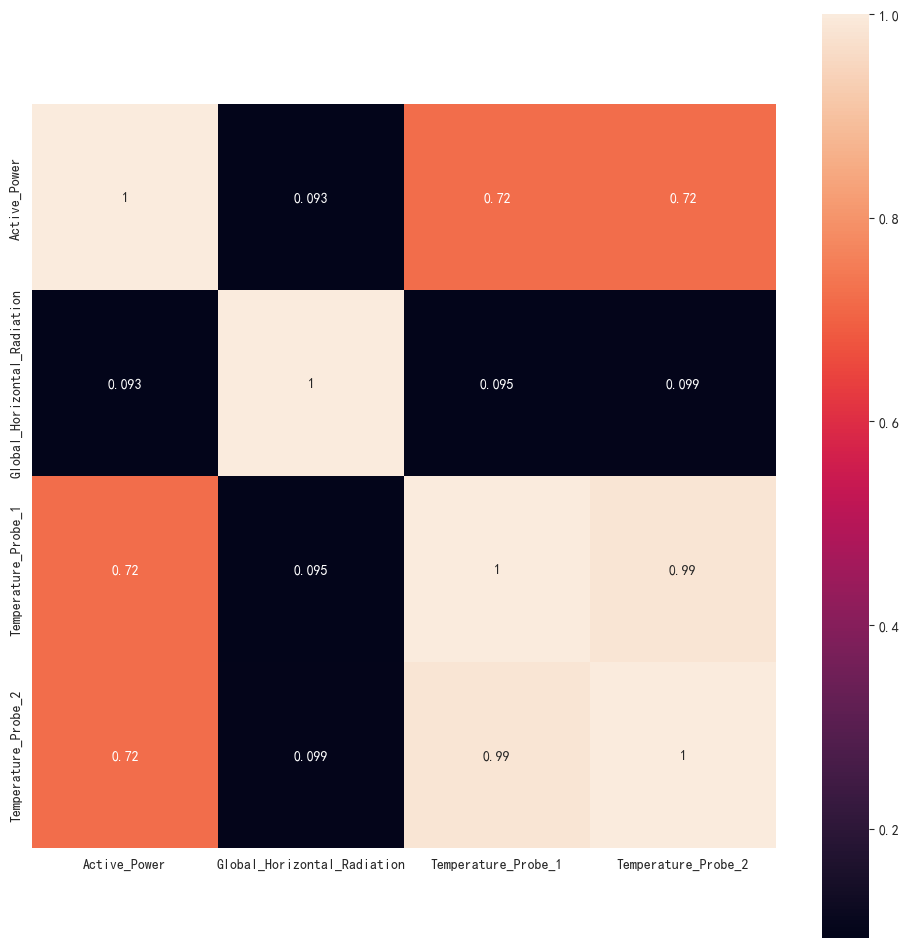

In [7]:
# 相关性绘图
# 热力图
import matplotlib as mpl
import seaborn as sns
# 显示汉字
mpl.rcParams['font.sans-serif'] = [u'SimHei']
mpl.rcParams['axes.unicode_minus'] = False
result_5 = dataset.loc[:, 
           ['Active_Power', 'Global_Horizontal_Radiation', 'Temperature_Probe_1', 'Temperature_Probe_2']]
figure, ax = plt.subplots(figsize=(12, 12))
sns.heatmap(result_5.corr(), square=True, annot=True, ax=ax)

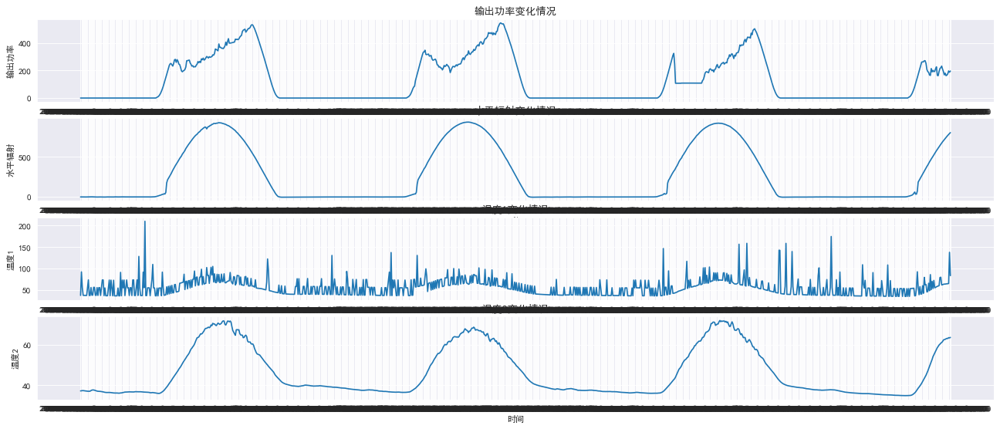

In [8]:
# 绘制相关数据的时间曲线，看是否有异常数据
fig = plt.figure(figsize=(20, 8), dpi=80)
# 行，列，索引
plt.subplot(4, 1, 1)
X_1 = dataset.loc[0:1000, 'timestamp']
Y_1 = dataset.loc[0:1000, 'Active_Power']
plt.plot(X_1, Y_1)
plt.xlabel('时间')
plt.ylabel('输出功率')
plt.title('输出功率变化情况')

plt.subplot(4, 1, 2)
Y_1 = dataset.loc[0:1000, 'Global_Horizontal_Radiation']
plt.plot(X_1, Y_1)
plt.xlabel('时间')
plt.ylabel('水平辐射')
plt.title('水平辐射变化情况')

plt.subplot(4, 1, 3)
Y_1 = dataset.loc[0:1000, 'Temperature_Probe_1']
plt.plot(X_1, Y_1)
plt.xlabel('时间')
plt.ylabel('温度1')
plt.title('温度1变化情况')

plt.subplot(4, 1, 4)
Y_1 = dataset.loc[0:1000, 'Temperature_Probe_2']
plt.plot(X_1, Y_1)
plt.xlabel('时间')
plt.ylabel('温度2')
plt.title('温度2变化情况')

plt.show()

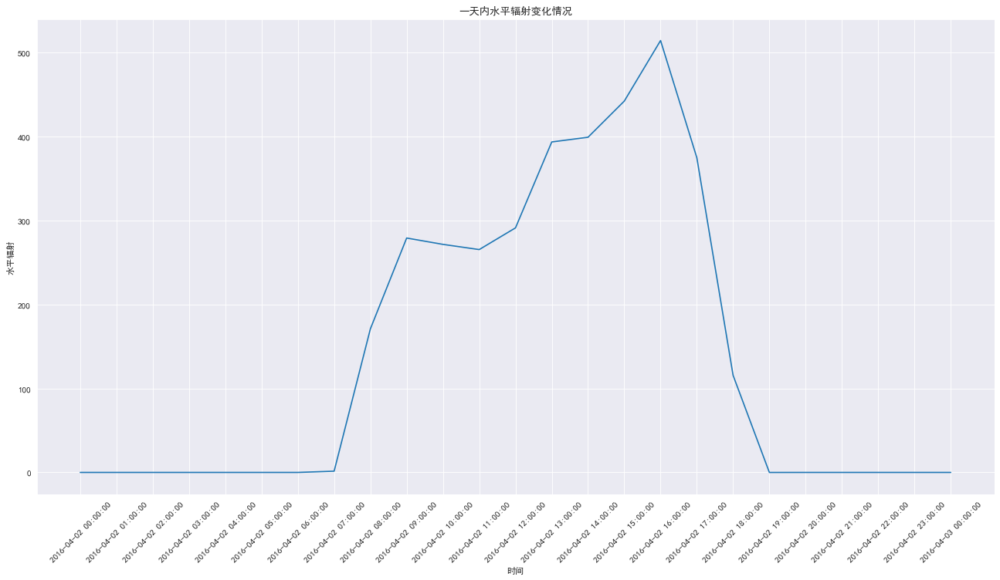

In [9]:
# 此时我注意到，在夜晚时间中，是不用考虑数据功率的，于是我绘制一天的时间变化，选取白天06:00--18:00的数据：
# 显示一天中输出功率的大致时间
# 行，列，索引
plt.figure(figsize=(20, 10), dpi=80)
X_2 = dataset.loc[0 + 3:288 + 3 :12, 'timestamp']
Y_2 = dataset.loc[0 + 3:288 + 3 :12, 'Active_Power']

plt.xticks(rotation=45)
plt.plot(X_2, Y_2)
plt.xlabel('时间')
plt.ylabel('水平辐射')
plt.title('一天内水平辐射变化情况')
plt.show()


In [10]:
# 由图可知，晚上输出功率为0，选取每天06:00--18:00的数据
from datetime import datetime
dataset['datetime'] = dataset['timestamp'].apply(lambda x:datetime.strptime(x, "%Y-%m-%d %H:%M:%S").hour)
filred_data = dataset[(dataset['datetime'] >= 6) & (dataset['datetime'] <= 18)]
filred_data = filred_data.fillna(0)

In [11]:
# 去除掉不相干的列
filred_data = filred_data.drop('datetime', axis=1)
filred_data = filred_data.drop('Active_Energy_Delivered_Received', axis=1)
filred_data = filred_data.drop('Current_Phase_Average_Mean', axis=1)
filred_data = filred_data.drop('Wind_Speed', axis=1)
filred_data = filred_data.drop('Weather_Temperature_Celsius', axis=1)
filred_data = filred_data.drop('Wind_Direction', axis=1)
filred_data = filred_data.drop('Weather_Daily_Rainfall', axis=1)
filred_data = filred_data.drop('Max_Wind_Speed', axis=1)
filred_data = filred_data.drop('Air_Pressure', axis=1)
filred_data = filred_data.drop('Hail_Accumulation', axis=1)
filred_data = filred_data.drop('Pyranometer_1', axis=1)
filred_data

,timestamp,Active_Power,Global_Horizontal_Radiation,Temperature_Probe_1,Temperature_Probe_2,label
75,2016-04-02 06:00:00,-0.173519,-3.298633,36.709805,36.590378,-0.172739
76,2016-04-02 06:05:00,-0.173673,-3.565461,36.694046,36.584209,-0.171552
77,2016-04-02 06:10:00,-0.173498,-3.444971,54.904255,36.537823,-0.165691
78,2016-04-02 06:15:00,-0.173507,-2.895792,54.872681,36.495571,-0.149994
79,2016-04-02 06:20:00,-0.173559,-3.199855,54.800522,36.424980,-0.116044
...,...,...,...,...,...,...
892083,2024-11-28 18:35:00,49.711971,86.098564,44.106686,43.998241,18.486418
892084,2024-11-28 18:40:00,41.862549,81.358002,43.883686,43.784386,11.461096
892085,2024-11-28 18:45:00,40.929993,81.420662,43.671650,43.553913,4.787055
892086,2024-11-28 18:50:00,36.348747,84.782608,43.563332,43.443810,2.028671


In [12]:
# 调整序号（index是csv文件使用pandas读入python之后自动分配的，所以在筛选掉一些行之后会出现不连续的情况）
filred_data = filred_data.reset_index(drop=True)
filred_data

,timestamp,Active_Power,Global_Horizontal_Radiation,Temperature_Probe_1,Temperature_Probe_2,label
0,2016-04-02 06:00:00,-0.173519,-3.298633,36.709805,36.590378,-0.172739
1,2016-04-02 06:05:00,-0.173673,-3.565461,36.694046,36.584209,-0.171552
2,2016-04-02 06:10:00,-0.173498,-3.444971,54.904255,36.537823,-0.165691
3,2016-04-02 06:15:00,-0.173507,-2.895792,54.872681,36.495571,-0.149994
4,2016-04-02 06:20:00,-0.173559,-3.199855,54.800522,36.424980,-0.116044
...,...,...,...,...,...,...
483603,2024-11-28 18:35:00,49.711971,86.098564,44.106686,43.998241,18.486418
483604,2024-11-28 18:40:00,41.862549,81.358002,43.883686,43.784386,11.461096
483605,2024-11-28 18:45:00,40.929993,81.420662,43.671650,43.553913,4.787055
483606,2024-11-28 18:50:00,36.348747,84.782608,43.563332,43.443810,2.028671


In [13]:
# 这个时候再来查找异常值，异常值的定义有很多方式：3a法，Z_score法，箱线法等。这里采用3a法：
# 用3sigma法找出超出（u-3a, u+3a）的值
import numpy as np
def three_sigma(ser):
    # 计算平均值
    mean_data = ser.mean()
    # 计算标准差
    std_data = ser.std()
    rule = (mean_data - 3 * std_data > ser) | (mean_data + 3 * std_data < ser)
    # 生成一个从0开始，到ser长度-1结束的连续索引，再根据rule列表中的True值，直接保留所有为True的索引，也就是异常值的行索引
    index = np.arange(ser.shape[0])[rule]
    # 获取异常值
    outliers = ser.iloc[index]
    return outliers

# 异常值处理
mean_data = filred_data['Temperature_Probe_1'].mean()
mean_data

46.73458654848854

8         109.546310
56         94.140579
64         98.317368
70        102.295715
75        102.772926
             ...    
483582      0.000000
483583      0.000000
483594      0.000000
483599      0.000000
483600      0.000000
Name: Temperature_Probe_1, Length: 24400, dtype: float64


C:\Users\Titanium\AppData\Local\Temp\ipykernel_6232\2254402820.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  true_data[i] = mean_data
C:\Users\Titanium\AppData\Local\Temp\ipykernel_6232\2254402820.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  true_data[i] = mean_data
C:\Users\Titanium\AppData\Local\Temp\ipykernel_6232\2254402820.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  true_data[i] = mean_data
C:\Users\Titanium\A

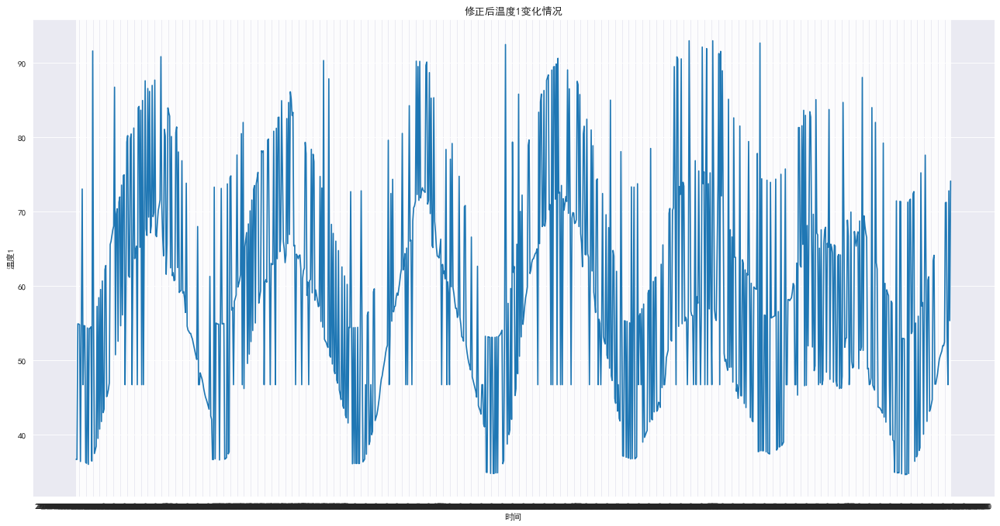

In [14]:
# 异常值的处理有很多方式，插值替代，均值替代等。这里我选用的是均值替代：
# 由图可知，对温度1的数据进行异常值处理：均值替代
# 经常用的还有插值法
error_data = three_sigma(filred_data['Temperature_Probe_1'])
true_data = filred_data['Temperature_Probe_1']
print(error_data)
for i, v in error_data.items():
    true_data[i] = mean_data

plt.figure(figsize=(20, 10), dpi=80)
X_1 = filred_data.loc[0:1000, 'timestamp']
Y_1 = true_data[0:1001]
plt.plot(X_1, Y_1)
plt.xlabel('时间')
plt.ylabel('温度1')
plt.title('修正后温度1变化情况')
plt.show()

然后可以开始准备训练数据了。首先是标准化，主要是为了避免不同量纲的影响，可以采用0-1归一化：

In [15]:
# 标准化
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
# 注意左闭右开
# 归一化是为了避免不同量纲的影响
X_3 = scaler.fit_transform(filred_data.iloc[:, 1:5])

然后划分训练集（80%），测试集（20%）以及其y值（就是预测的结果）：

In [16]:
# 0.8为训练集，0.2为测试集
train_size = int(len(X_3) * 0.8)
test_size = int(len(X_3)) - train_size
train_data = X_3[0:train_size, 0:4]
# y值是对应的预测值
y_train_data = list(filred_data.iloc[0:train_size, 5])
test_data = X_3[train_size:, 0:4]
y_test_data = list(filred_data.iloc[train_size:, 5])

In [17]:
# LSTM模型构建，多输入单输出
# 取一定时间内的数据作为输入，预测该时间后一段时间的label，最后不断缩小差值loss
# 记忆的天数
men_days = 5

from collections import deque
deq = deque(maxlen=men_days)

X_4 = []
for i in train_data:
    deq.append(list(i))
    if len(deq) == men_days:
        X_4.append(list((deq)))
X_Test = []
for i in test_data:
    deq.append(list(i))
    if len(deq) == men_days:
        X_Test.append(list((deq)))

X_4 = np.array(X_4)
X_Test = np.array(X_Test)

对齐一下array的长度：

In [18]:
y_train_data = np.array(y_train_data[:-men_days+1])
y_test_data = np.array(y_test_data[:])

开始创建并训练LSTM:

In [19]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset

X_4_tensor = torch.Tensor(X_4)
y_train_data_tensor = torch.Tensor(y_train_data)
train_dataset = TensorDataset(X_4_tensor, y_train_data_tensor)
train_loader = DataLoader(train_dataset, batch_size=20, shuffle=False)

X_Test_tensor = torch.Tensor(X_Test)
y_test_data_tensor = torch.Tensor(y_test_data)

test_dataset = TensorDataset(X_Test_tensor, y_test_data_tensor)
test_loader = DataLoader(test_dataset, batch_size=20, shuffle=False)

In [20]:
class LSTMModel(nn.Module):
    def __init__(self, input_size, hidden_size, output_size):
        super(LSTMModel, self).__init__()
        self.lstm = nn.LSTM(input_size, hidden_size, batch_first=True)
        self.dropout = nn.Dropout(0.5)
        self.fc = nn.Linear(hidden_size, output_size)
    
    def forward(self, x):
        lstm_out, (hn, cn) = self.lstm(x)
        lstm_out = lstm_out[:, -1, :]
        lstm_out = self.dropout(lstm_out)
        out = self.fc(lstm_out)
        return out

# 模型超参数
input_size = X_4.shape[2]
hidden_size = 32
output_size = 1

model = LSTMModel(input_size, hidden_size, output_size)

criterion = nn.L1Loss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

In [23]:
epochs = 20
train_loss = []
test_loss = []
for epoch in range(epochs):
    model.train()
    running_train_loss =0.0
    for inputs, labels in train_loader:
        inputs, labels = inputs.float(), labels.float()
        outputs = model(inputs)
        loss = criterion(outputs.squeeze(), labels)
        
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        
        running_train_loss += loss.item()
    # print(f"Epoch {epoch+1}/{epochs}, Loss: {running_train_loss/len(train_loader)}")
    avg_train_loss = running_train_loss / len(train_loader)
    train_loss.append(avg_train_loss)
    
    model.eval()
    running_test_loss = 0.0
    with torch.no_grad():
        for inputs, labels in test_loader:
            inputs, labels = inputs.float(), labels.float()
            outputs = model(inputs)
            loss = criterion(outputs.squeeze(), labels)
            running_test_loss += loss.item()
    avg_test_loss = running_test_loss / len(test_loader)
    test_loss.append(avg_test_loss)
    
    print(f"Epoch {epoch+1}/{epochs}, Train Loss: {avg_train_loss:.4f}, Test Loss: {avg_test_loss:.4f}")
    
print("Training completed.")

Epoch 1/20, Train Loss: 108.5445, Test Loss: 78.4362
Epoch 2/20, Train Loss: 50.5858, Test Loss: 72.3282
Epoch 3/20, Train Loss: 45.5425, Test Loss: 70.0858
Epoch 4/20, Train Loss: 44.2652, Test Loss: 69.5689
Epoch 5/20, Train Loss: 43.4511, Test Loss: 68.8988
Epoch 6/20, Train Loss: 43.0366, Test Loss: 68.2778
Epoch 7/20, Train Loss: 42.6534, Test Loss: 67.2957
Epoch 8/20, Train Loss: 42.2138, Test Loss: 67.9257
Epoch 9/20, Train Loss: 42.1469, Test Loss: 67.3579
Epoch 10/20, Train Loss: 41.7118, Test Loss: 67.1911
Epoch 11/20, Train Loss: 41.5391, Test Loss: 66.4715
Epoch 12/20, Train Loss: 41.2868, Test Loss: 66.6048
Epoch 13/20, Train Loss: 41.0170, Test Loss: 65.6953
Epoch 14/20, Train Loss: 40.8043, Test Loss: 65.5595
Epoch 15/20, Train Loss: 40.6392, Test Loss: 65.9595
Epoch 16/20, Train Loss: 40.3715, Test Loss: 65.4549
Epoch 17/20, Train Loss: 40.2170, Test Loss: 65.8022
Epoch 18/20, Train Loss: 40.1397, Test Loss: 66.0899
Epoch 19/20, Train Loss: 39.9838, Test Loss: 65.3669
E

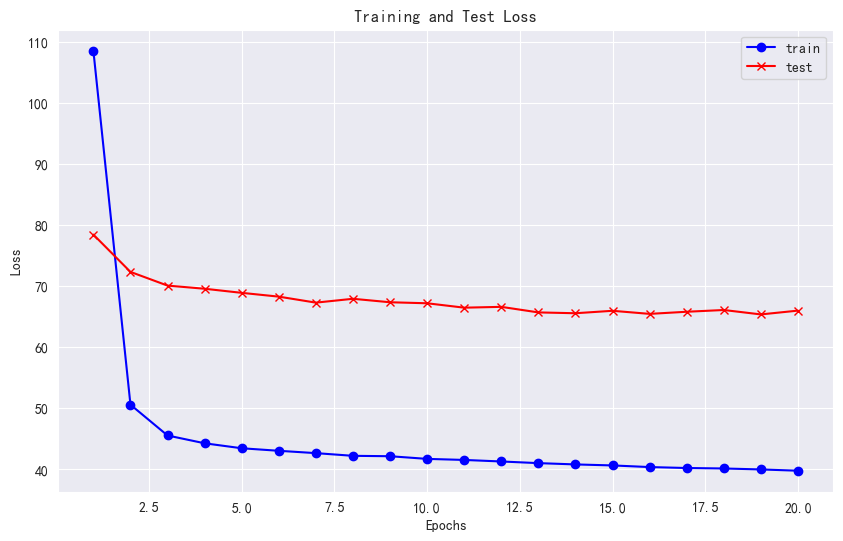

In [24]:
# train_loss = [108.5445, 50.5858, 45.5425, 44.2652, 43.4511, 43.0366, 42.6534, 42.2138, 42.1469, 41.7118,
#                       41.5391, 41.2868, 41.0170, 40.8043, 40.6392, 40.3715, 40.2170, 40.1397, 39.9838, 39.7732]
# test_loss = [78.4362, 72.3282, 70.0858, 69.5689, 68.8988, 68.2778, 67.2957, 67.9257, 67.3579, 67.1911, 
#              66.4715, 66.6048, 65.6953, 65.5595, 65.9595, 65.4549, 65.8022, 66.0899, 65.3669, 65.9876]
plt.figure(figsize=(10, 6))
plt.plot(range(1, epochs + 1), train_loss, label='train', color='blue', marker='o')
plt.plot(range(1, epochs + 1), test_loss, label='test', color='red', marker='x')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Test Loss')
plt.legend()
plt.show()

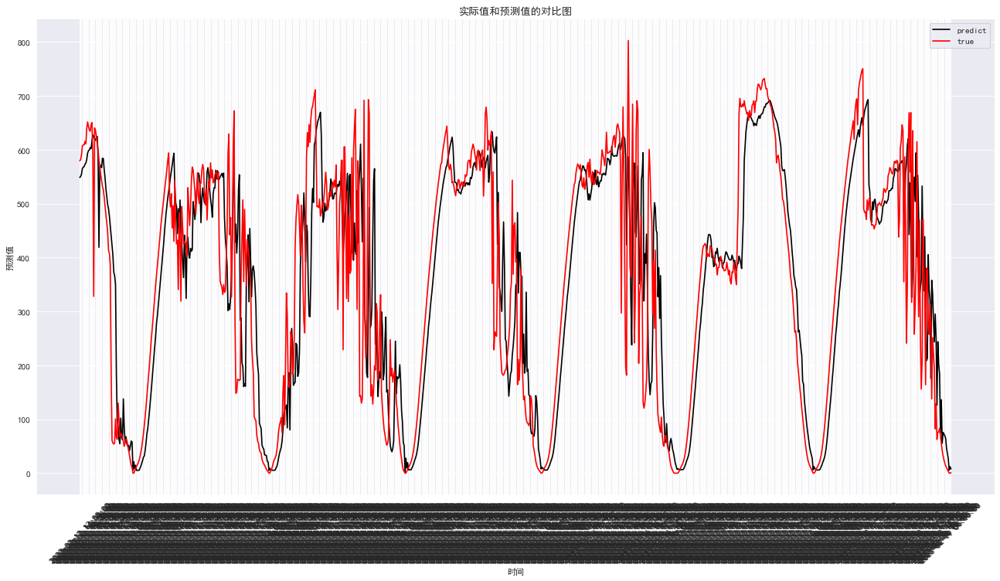

In [28]:
from numpy import concatenate
# print(X_Test)
model.eval()
with torch.no_grad():
    y_predict = model(X_Test_tensor)
y_predict.squeeze()
x_predict = filred_data.loc[train_size:, 'timestamp']
plt.figure(figsize=(20,10),dpi=80)
plt.plot(x_predict[0:1000],y_predict[0:1000],color='black', label='predict')
plt.plot(x_predict[0:1000],y_test_data[0:1000],color='red', label='true')
plt.xticks(rotation=45)
plt.xlabel('时间')
plt.ylabel('预测值')
plt.title('实际值和预测值的对比图')
plt.legend()
plt.show()